# Clustering packets of WPT using k-means method - applied to the synthetic data obtained by solving GA
This notebook follows the  the method specified in the **paper**, using the results of processed synthetic signals. Here we use average energy, spectral entropy, kurtosis and log-energy for k-means clustering and thresholding. 

In [3]:
import sys
if sys.version_info[0] + 0.1 * sys.version_info[1] < 3.6:
    raise Exception("Must be using Python 3.6+ version")

In [4]:
%matplotlib inline
sys.path.append("..")

import plotly.express as px

import numpy as np
import wavelet_transform.utils.training_data as train
from wavelet_transform.postprocess import plotting as plot
from wavelet_transform.utils.extensions import psd, trim_data
from wavelet_transform.utils.machine_learning import train_k_means
from wavelet_transform.utils.preprocessing import preprocess
from wavelet_transform.utils.bubbledynamics import BubbleDynamics as BD
import wavelet_transform.wpt.transform as wpt
from wavelet_transform.postprocess.plotting import relabel

### Parameters
Specify parameters for solving GA and generating synthetic data, and performing wavelet transform. The ultrasound parameters are fixed at 1MHz and 1MPa.

transient cavitation with multiple ultra- and harmonics + BB: r_init = 0.5e-6

In [5]:
# Set the sonication pulse parameters
pac = 1e6  # the amplitude of the sine wave in Pa
frequency = 1.1 * 1e6  # insonation frequency (Hz)
period = 1 / frequency # the period of the acoustic wave at the fundamental frequency 
n_cycles = 100  # no. of cycles of the sine wave
t_delay = 0 * period  # time delay, t1
pulse_width = 1000 * n_cycles * period  # pulse width, W = 1 / Q
phase_initial = 0 * period  # tau
phase_shift = 0 # phi
n_harmonics = 1   # k
Rdot_init = 0  # initial bubble's wall velocity in m/s
tmax = n_cycles / frequency
tstep = 1e-9
time = np.arange(0, tmax, tstep)

# Set sampling rate and noise std
sampling_rate = frequency * 1e2  # sampling rate to generate the time vector
signal2noise = 30

r_measure = 1e-4 # distance from the centre of bubble which radiated pressure (acoustic emission from bubble) is calculated over time

The R0 (initial bubble radius) values are defined below. We consider the sonication parameters to be fixed and different stable and transient cavitation scenarios are designed by only changing the initial bubble radius.  

In [6]:
# Transient with multiple ultra- and harmonics + broadband in acoustic emission
Rinit = 0.5e-6  # initial bubble radius in meters

Setting the wavelet transform parameters:

In [55]:
# Parameters for the wavelet transform
wavelet = "db20"
levels = 7  # set to None to use max-level transform
mode = "symmetric"
use_min_entropy = True
min_level = 1
freq_threshold = 1 # the nodes with norm_freq_range above this threshold will not be kept
fft_lim = 6 # this is the upper limit for plotting the spectrum (fft/psd of emissions)
keep_ratio = "valid"

### Generating acoustic emission data by solving Gilmore-Akulichev model
Generate the acoustic emission data and add measurement noise (assuming additive white Gaussian noise). The parameters are defined above. 

In [56]:
# BUBBLE DYNAMICS DATA

# Generate sound wave
BD_obj = BD(
    Rinit, 
    Rdot_init, 
    frequency, 
    pac, 
    t_delay,
    pulse_width,
    phase_initial,
    phase_shift,
    n_harmonics,
    time,
    deltat=1e-9
)
BD_obj.solver()

# Calculate pressure radiated (proportional to measured voltage)
BD_obj.calculate_p_radiated(r_measure)
data = BD_obj.p_radiated

# Add noise 
data = train.add_noise(data, signal2noise)
# Normalise
data_preprocessed = preprocess(data, window=False)

# Trimming data for visualisation
data_trunc, t_data_trunc = trim_data(data_preprocessed, time, (0*period, 7*period), return_time=True)
psd_amp, psd_freq = psd(data_preprocessed, sampling_rate, frequency)

Plotting the acoustic emissions and their spectra.

In [57]:
fig = px.line(x=t_data_trunc, y=data_trunc)
fig.update_layout(
    xaxis=dict(title="t/period [DL]"),
    yaxis=dict(title="Radiated pressure /p<sub>0</sub> [DL]"),
)
fig.show()

## Wavelet transform of the preprocessed signal


In [58]:
# DWPT
tr_obj = wpt.dwpt(
    data,
    levels,
    wavelet,
    mode,
    min_entropy=True,
    min_level=min_level,
    freq_threshold=freq_threshold,
)

tr_obj.keep_ratio = keep_ratio

wpt_df = tr_obj.info(levels, order="natural", leaf_nodes=True)

### Heisenberg visualisation
Making the Heisenberg plot of the dwpt transform

In [59]:
tr_obj.calc_frequencies(sampling_rate)
# fig = plot.heisenberg(
#     tr_obj, max(time), padding="interpolate", use_log_scale=False, max_freq=.2,
#     vmin=None, vmax=10
# )

### K-means

k-means clustering on the calculated statistics from the output of the DWPT. The classification metrics used in the paper are: 
    "average energy",
    "kurtosis",
    "log average energy",
    "spectral entropy".

In [60]:
# k-means parameters
kmeans_params = {"init": "k-means++",
    "n_init":20,
    "max_iter":1000,
    "tol":1e-20,
    "verbose":0,
    # "algorithm":"lloyd",
    }

# training data
classifying_metrics = [
    "log average energy",
    "kurtosis",
    "spectral entropy",
    "average energy",
    # "level entropy",
    # "skewness"
    # "entropy",
    # "crest factor",
]

In [61]:
wpt_df_train = wpt_df.copy()
no_clusters = 2

data_train, labels, data_train_normalised, centers, scaler, kmeans = train_k_means(
    wpt_df_train, 
    classifying_metrics, 
    no_clusters=no_clusters, 
    kmeans_params=kmeans_params, 
    scale_data="standard"
)

centers_scaled = scaler.fit_transform(centers)
centers_sorted, labels_sorted = relabel(labels, centers, "average energy", ascending=False)

# Plotting

## Tree plot

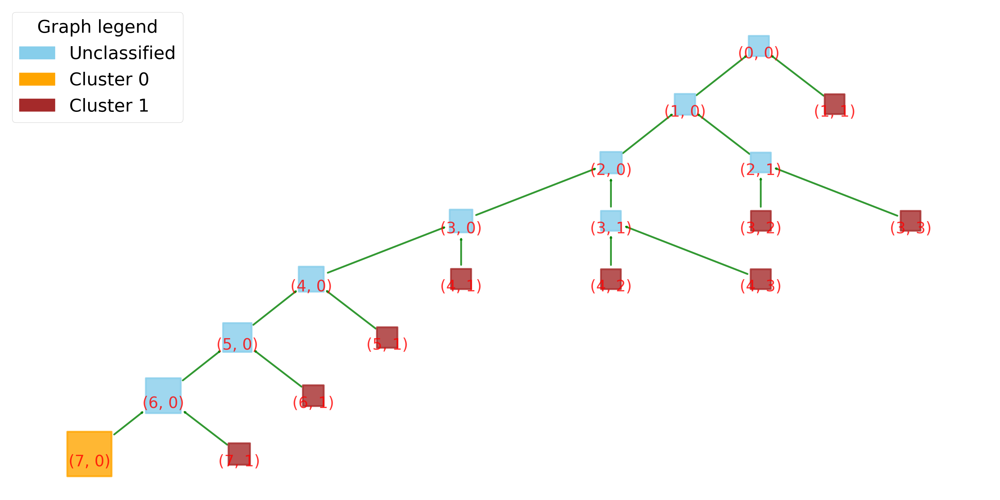

In [62]:
tr_obj.plot_tree(node_size="average energy", node_colour=list(labels_sorted))

### 3d plot

3d plots of the clustering results with axes: energy, kurtosis, crest factor

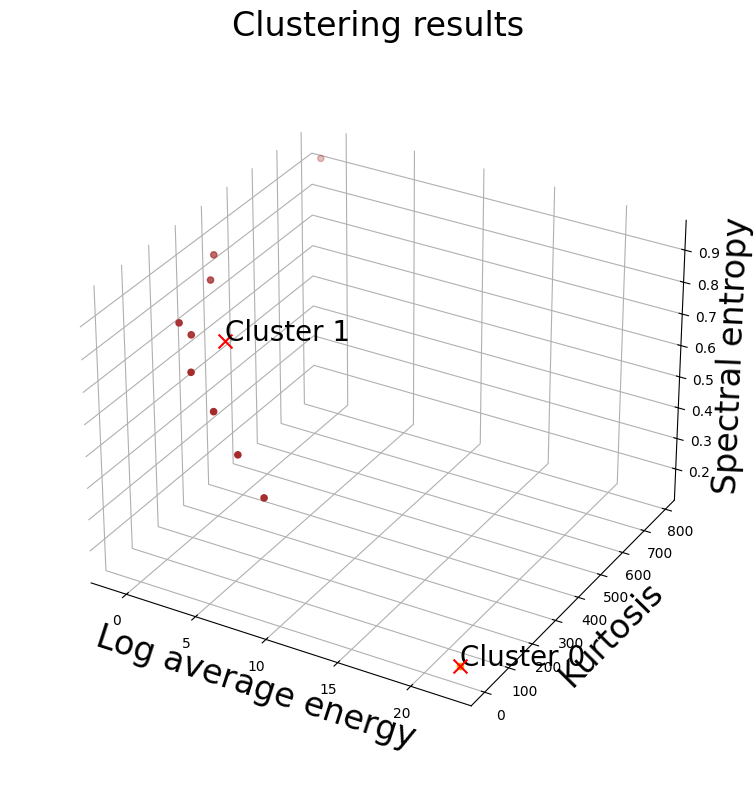

In [63]:
fig_cls = plot.plot_clustering(
    data_train,
    centers_sorted, 
    labels_sorted,
    metrics_to_plot=classifying_metrics[:3],
)

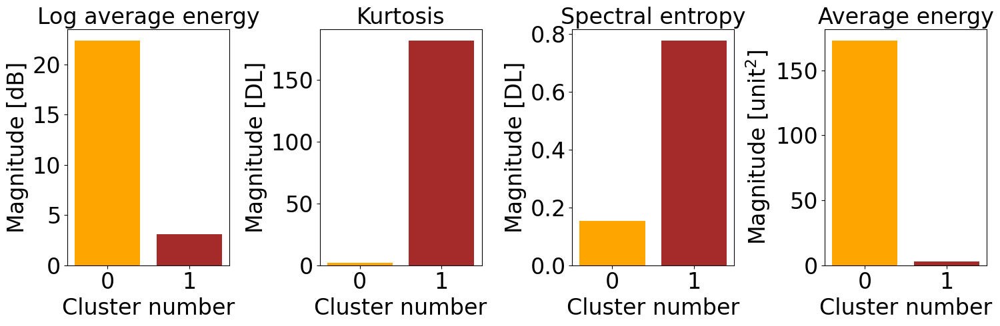

In [64]:
# Plot centroid metrics
fig_metrics = plot.plot_centers(
    data_train.columns.to_list(), 
    centers_sorted
)

In [65]:
fig_psd_rec = plot.plot_fft_by_group(
    tr_obj, labels_sorted, sampling_rate=sampling_rate,
    clusters=None, xlims=(0, fft_lim), fundamental_freq=frequency,
    freq_threshold=freq_threshold,
)

fig_rec = plot.plot_reconstructions_by_group(
    tr_obj, labels_sorted, t_plot=t_data_trunc, freq_threshold=freq_threshold
)